In [2]:
import scanpy as sc
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scanpy.external as sce
import anndata
import harmonypy as hm
import os
from scipy.sparse import csr_matrix #für die sparse matrix
import warnings
warnings.simplefilter("ignore", FutureWarning)
warnings.simplefilter("ignore", UserWarning)
warnings.simplefilter("ignore", RuntimeWarning)
from scipy import stats
random_state=10

Matplotlib created a temporary cache directory at /tmp/matplotlib-2yp6lszg because the default path (/home/jovyan/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


In [45]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor="white")

scanpy==1.10.2 anndata==0.10.8 umap==0.5.6 numpy==1.24.4 scipy==1.11.3 pandas==2.2.3 scikit-learn==1.3.1 statsmodels==0.14.0 igraph==0.11.6 pynndescent==0.5.13


In [46]:
# Ensure editable text in PDF exports
plt.rcParams['pdf.fonttype'] = 42

In [16]:
# due to file size some umaps blinded

# Global object

In [2]:
adata_global=sc.read_h5ad('/data2/core-med1/nhadizad/nastaran/Xenotransplant/global/global objects/global_v8/20240220_el_Xenotransplant_noBR_ANNOTATED_pc39_noreg_CELL_STATES_Processed_v8.h5ad')

In [3]:
adata_global

AnnData object with n_obs × n_vars = 211317 × 8077
    obs: 'n_genes', 'scrublet_score_default', 'predicted_doublets_default', 'scrublet_score_z', 'predicted_doublets_z', 'scrublet_score_log', 'predicted_doublets_log', 'percent_mito', 'percent_ribo', 'percent_ribo_RPS', 'percent_ribo_RPL', 'n_counts', 'solo_softmax_scores', 'solo_logit_scores', 'solo_is_doublet', 'n_counts_Papio_anubis', 'n_counts_Sus_scrofa', 'n_genes_Papio_anubis', 'n_genes_Sus_scrofa', 'Sample_ID', 'doublets_ncounts', 'pCMV_score', 'n_counts_pCMV', 'leiden_02', 'cell_type', 'cell_type_V1', 'Treatment', 'Survival', 'Endpoint_status', 'Species', 'pCMV_infected_score', 'cell_states', 'leiden_annotated', 'Subgroups', 'Groups', 'pCMV_PCR_detected', 'pCMV_ELISA_detected', 'Survival_groups', 'Proliferating', 'pCMV_infected_cellstate', 'Conditions', 'pCMV_infection_threshold2', 'n_genes_pCMV', 'PCMV_infection', 'Condition_subsets'
    var: 'Average_expression', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 

In [5]:
import numpy as np
import matplotlib.colors as mcolors

# Get unique cell types
cell_type = np.unique(adata_global.obs['cell_type'])

# Your custom color list (extend as needed)
color_list = [
    '#8dd3c7', '#4A7E9A', '#bebada', '#80b1d3',
    '#fdb462', '#b3de69', '#C5B0D5', '#bc80bd',
    '#ccebc5', '#ffed6f', '#b15928'  # Added 3 extra colors
][:len(cell_type)]  # Trim to exact number needed

# Create dictionary {cell_type: hex_color}
color_dict = {ct: color_list[i] for i, ct in enumerate(cell_type)}


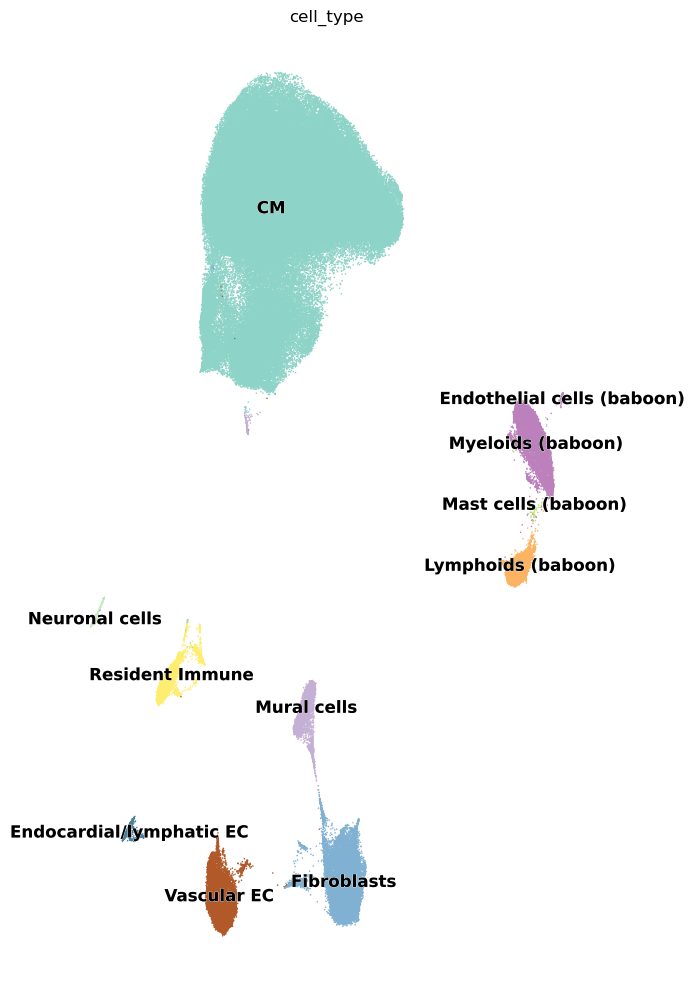

In [6]:
import matplotlib
import matplotlib.pyplot as plt
import scanpy as sc

fig, ax = plt.subplots(figsize=(7, 10))

sc.pl.umap(adata_global, 
           color=["cell_type"],
           frameon=False,
           legend_loc='on data',
           legend_fontoutline=0.5,
           size=5,
           legend_fontsize=12,
           palette=color_dict,  # Your custom color dictionary
           ax=ax,
           show=False)

ax.set_xlabel('UMAP1', fontsize=16, loc='left')
ax.set_ylabel('UMAP2', fontsize=16, loc='bottom')
ax.tick_params(labelbottom=True, labelleft=True, labelsize=14)
plt.tight_layout()
plt.show()


In [15]:
#import matplotlib
#import matplotlib.pyplot as plt
#import scanpy as sc
#
#fig, ax = plt.subplots(figsize=(10, 7))
#
#sc.pl.umap(adata_global, 
#           color=["cell_type"],
#           frameon=False,
#           legend_loc='off data',
#           legend_fontoutline=0.5,
#           size=5,
#           legend_fontsize=12,
#           palette=color_dict,  # Your custom color dictionary
#           ax=ax,
#           show=False)
#
#ax.set_xlabel('UMAP1', fontsize=16, loc='left')
#ax.set_ylabel('UMAP2', fontsize=16, loc='bottom')
#ax.tick_params(labelbottom=True, labelleft=True, labelsize=14)
#plt.tight_layout()
#plt.show()

In [ ]:
# Res_Immune ALL

In [29]:
Res_Immune=sc.read_h5ad('/data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/final objects/final_pig_immune_annotation.h5ad')

In [30]:
Res_Immune

AnnData object with n_obs × n_vars = 3759 × 53826
    obs: 'n_genes', 'scrublet_score_default', 'predicted_doublets_default', 'scrublet_score_z', 'predicted_doublets_z', 'scrublet_score_log', 'predicted_doublets_log', 'percent_mito', 'percent_ribo', 'percent_ribo_RPS', 'percent_ribo_RPL', 'n_counts', 'solo_softmax_scores', 'solo_logit_scores', 'solo_is_doublet', 'n_counts_Papio_anubis', 'n_counts_Sus_scrofa', 'n_genes_Papio_anubis', 'n_genes_Sus_scrofa', 'Sample_ID', 'doublets_ncounts', 'pCMV_score', 'n_counts_pCMV', 'leiden_02', 'cell_type', 'cell_type_V1', 'Treatment', 'Survival', 'Endpoint_status', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden_10', 'new_endpoints', 'pig_immune_leiden_10'
    var: 'Average_expression', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable'
    uns: 'Sample_ID_colors', 'leiden_10_colors', 'log1p', 'pig_immune_leiden_10_colors', 'wilcoxon'
    obsm: 'X_pca_harmony', 'X_uma

In [14]:
#import matplotlib.pyplot as plt
#import scanpy as sc
#
## Create figure with high resolution
#fig, ax = plt.subplots(figsize=(5, 5), dpi=600)
#
## Generate UMAP plot
#sc.pl.umap(Res_Immune, 
#           color=["pig_immune_leiden_10"],
#           frameon=False,
#           legend_loc='on data',
#           legend_fontoutline=0.5,
#           size=3,
#           legend_fontsize=12,
#           palette="tab20",
#           ax=ax,
#           show=False)
#
## Axis labels and tick parameters
#ax.set_xlabel('UMAP1', fontsize=16, loc='left')
#ax.set_ylabel('UMAP2', fontsize=16, loc='bottom')
#ax.tick_params(labelbottom=True, labelleft=True, labelsize=14)
#plt.tight_layout()
#
## Save to PDF with high quality
#pdf_folder = '/data2/core-med1/fibecker/fibecker/New_data_Xentransplantation/FINAL_whole_object_all_combined/Whole_object analysis/UMAPS_for_publication/UMAPS_Results_PDF/'
#pdf_name = 'Global_object_UMAP_Res_Immune_with_legend_Color_tab20.pdf'
#output_path = pdf_folder + pdf_name
#plt.savefig(output_path, format='pdf', dpi=600, bbox_inches='tight', pad_inches=0.1)
#
## Display plot
#plt.show()


# Resident Immune_MP



In [25]:
Res_Immune_MP=sc.read_h5ad('/data2/core-med1/fibecker/fibecker/New_data_Xentransplantation/Immunecells_without_regress_out/FINAL_Objects_Annotated_Without_RO/FINAL_Pig_MP_Annotated_Without_RO.h5ad')

In [26]:
Res_Immune_MP

AnnData object with n_obs × n_vars = 2424 × 4004
    obs: 'n_genes', 'scrublet_score_default', 'predicted_doublets_default', 'scrublet_score_z', 'predicted_doublets_z', 'scrublet_score_log', 'predicted_doublets_log', 'percent_mito', 'percent_ribo', 'percent_ribo_RPS', 'percent_ribo_RPL', 'n_counts', 'solo_softmax_scores', 'solo_logit_scores', 'solo_is_doublet', 'n_counts_Papio_anubis', 'n_counts_Sus_scrofa', 'n_genes_Papio_anubis', 'n_genes_Sus_scrofa', 'Sample_ID', 'doublets_ncounts', 'pCMV_score', 'n_counts_pCMV', 'leiden_02', 'cell_type', 'cell_type_V1', 'Treatment', 'Survival', 'Endpoint_status', 'leiden_08', 'cell_states', 'pig_immune_leiden_10', 'new_endpoints', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden_01', 'leiden_03', 'leiden_05', 'leiden_07', 'leiden_09', 'leiden_10', 'leiden_named_08', 'leiden_named_09', 'leiden_named_10', 'leiden_named_03'
    var: 'Average_expression', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts',

In [13]:
#import matplotlib.pyplot as plt
#import scanpy as sc
#
## Create figure with high resolution
#fig, ax = plt.subplots(figsize=(4, 4), dpi=600)
#
## Generate UMAP plot
#sc.pl.umap(Res_Immune_MP, 
#           color=["leiden_named_10"],
#           frameon=False,
#           legend_loc='on data',
#           legend_fontoutline=0.5,
#           size=6,
#           legend_fontsize=12,
#           palette="tab20",
#           ax=ax,
#           show=False)
#
## Axis labels and tick parameters
#ax.set_xlabel('UMAP1', fontsize=16, loc='left')
#ax.set_ylabel('UMAP2', fontsize=16, loc='bottom')
#ax.tick_params(labelbottom=True, labelleft=True, labelsize=14)
#plt.tight_layout()
#
## Save to PDF with high quality
#pdf_folder = '/data2/core-med1/fibecker/fibecker/New_data_Xentransplantation/FINAL_whole_object_all_combined/Whole_object analysis/UMAPS_for_publication/UMAPS_Results_PDF/'
#pdf_name = 'Global_object_UMAP_Res_Immune_MP_with_legend_Color_tab20.pdf'
#output_path = pdf_folder + pdf_name
#plt.savefig(output_path, format='pdf', dpi=600, bbox_inches='tight', pad_inches=0.1)
#
## Display plot
#plt.show()


# Res_Immune_Lymph

In [33]:
Res_Immune_Lymph=sc.read_h5ad('/data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/final objects/annotated_pig_lymphoids_final.h5ad')

In [34]:
Res_Immune_Lymph

AnnData object with n_obs × n_vars = 559 × 53826
    obs: 'n_genes', 'scrublet_score_default', 'predicted_doublets_default', 'scrublet_score_z', 'predicted_doublets_z', 'scrublet_score_log', 'predicted_doublets_log', 'percent_mito', 'percent_ribo', 'percent_ribo_RPS', 'percent_ribo_RPL', 'n_counts', 'solo_softmax_scores', 'solo_logit_scores', 'solo_is_doublet', 'n_counts_Papio_anubis', 'n_counts_Sus_scrofa', 'n_genes_Papio_anubis', 'n_genes_Sus_scrofa', 'Sample_ID', 'doublets_ncounts', 'pCMV_score', 'n_counts_pCMV', 'leiden_02', 'cell_type', 'cell_type_V1', 'Treatment', 'Survival', 'Endpoint_status', 'leiden_08', 'cell_states', 'pig_immune_leiden_10', 'new_endpoints', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden_08_named'
    var: 'Average_expression', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable'
    uns: 'leiden_08_colors', 'leiden_08_named_colors', 'log1p', 'wilcoxon'
    obsm: 'X_pca_harmony'

In [12]:
#import matplotlib.pyplot as plt
#import scanpy as sc
#
## Create figure with high resolution
#fig, ax = plt.subplots(figsize=(5, 5), dpi=600)
#
## Generate UMAP plot
#sc.pl.umap(Res_Immune_Lymph, 
#           color=["leiden_08_named"],
#           frameon=False,
#           legend_loc='on data',
#           legend_fontoutline=0.5,
#           size=6,
#           legend_fontsize=12,
#           palette="tab20",
#           ax=ax,
#           show=False)
#
## Axis labels and tick parameters
#ax.set_xlabel('UMAP1', fontsize=16, loc='left')
#ax.set_ylabel('UMAP2', fontsize=16, loc='bottom')
#ax.tick_params(labelbottom=True, labelleft=True, labelsize=14)
#plt.tight_layout()
#
## Save to PDF with high quality
#pdf_folder = '/data2/core-med1/fibecker/fibecker/New_data_Xentransplantation/FINAL_whole_object_all_combined/Whole_object analysis/UMAPS_for_publication/UMAPS_Results_PDF/'
#pdf_name = 'Global_object_UMAP_Res_Immune_Lymph_with_legend_Color_tab20.pdf'
#output_path = pdf_folder + pdf_name
#plt.savefig(output_path, format='pdf', dpi=600, bbox_inches='tight', pad_inches=0.1)
#
## Display plot
#plt.show()


# Cardiomyocytes 

In [6]:
adata_CM=sc.read_h5ad('/data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/files v10/annotated_DEA_adata_v10.h5ad')

In [7]:
adata_CM

AnnData object with n_obs × n_vars = 137794 × 53826
    obs: 'n_genes', 'scrublet_score_default', 'predicted_doublets_default', 'scrublet_score_z', 'predicted_doublets_z', 'scrublet_score_log', 'predicted_doublets_log', 'percent_mito', 'percent_ribo', 'percent_ribo_RPS', 'percent_ribo_RPL', 'n_counts', 'solo_softmax_scores', 'solo_logit_scores', 'solo_is_doublet', 'n_counts_Papio_anubis', 'n_counts_Sus_scrofa', 'n_genes_Papio_anubis', 'n_genes_Sus_scrofa', 'Sample_ID', 'doublets_ncounts', 'pCMV_score', 'n_counts_pCMV', 'leiden_02', 'cell_type', 'cell_type_V1', 'Treatment', 'Survival', 'Endpoint_status', 'Species', 'pCMV_infected', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'cm_leiden_08', 'CM_subtype_annotation', 'new_groups'
    var: 'Average_expression', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable'
    uns: 'CM_subtype_annotation_colors', 'Sample_ID_colors', 'annotated_wilcoxon', 'cm_leiden_08_color

In [52]:
import numpy as np
import matplotlib.colors as mcolors

# Get unique cell types
cell_type = np.unique(adata_CM.obs['CM_subtype_annotation'])

# Your custom color list (extend as needed)
color_list = [
    '#608040', '#3e953e', '#39aa71', '#30bfbf', '#237cd4', '#1313ea', '#8000ff'

 # Added 3 extra colors
][:len(cell_type)]  # Trim to exact number needed

# Create dictionary {cell_type: hex_color}
color_dict = {ct: color_list[i] for i, ct in enumerate(cell_type)}


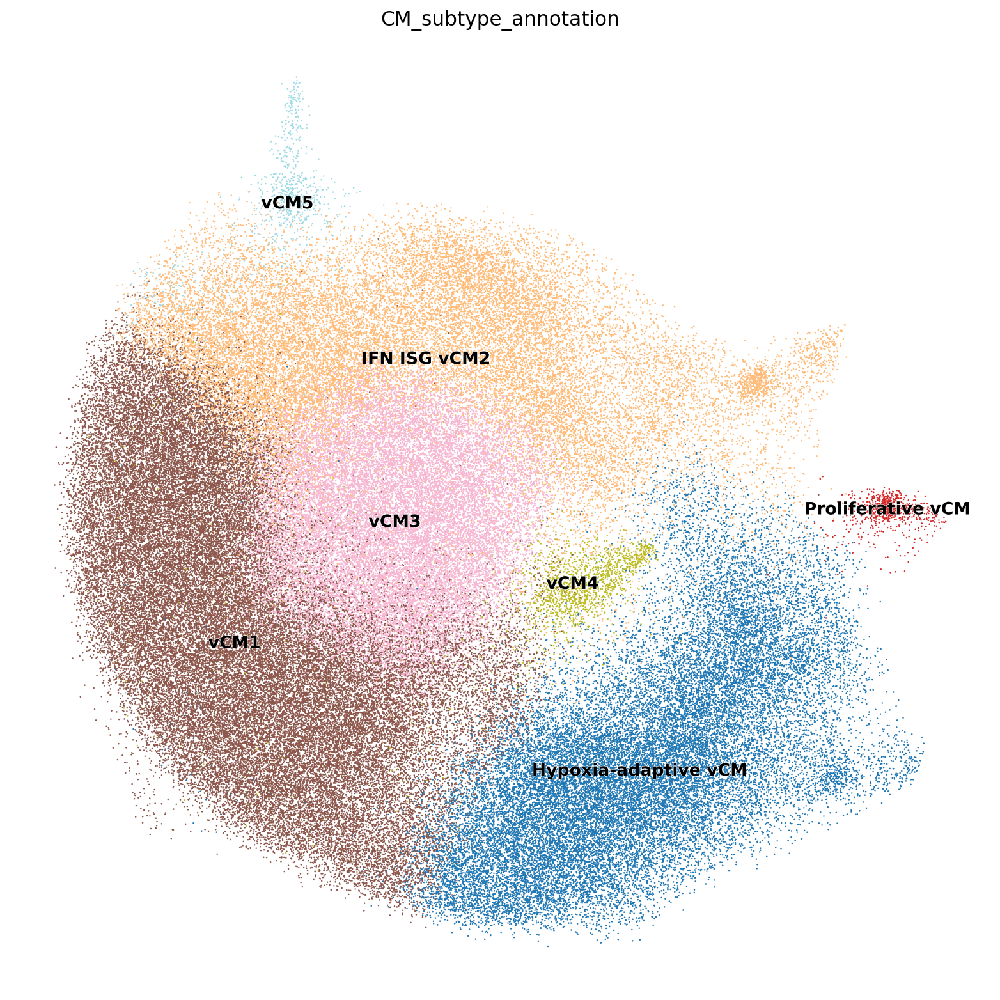

In [11]:
import matplotlib
import matplotlib.pyplot as plt
import scanpy as sc

fig, ax = plt.subplots(figsize=(10, 10))

sc.pl.umap(adata_CM, 
           color=["CM_subtype_annotation"],
           frameon=False,
           legend_loc='on data',
           legend_fontoutline=0.5,
           size=5,
           legend_fontsize=12,
           palette="tab20",  # Your custom color dictionary
           ax=ax,
           show=False)

ax.set_xlabel('UMAP1', fontsize=16, loc='left')
ax.set_ylabel('UMAP2', fontsize=16, loc='bottom')
ax.tick_params(labelbottom=True, labelleft=True, labelsize=14)
plt.tight_layout()
plt.show()


In [11]:
#import matplotlib.pyplot as plt
#import scanpy as sc
#
## Create figure with high resolution
#fig, ax = plt.subplots(figsize=(5, 5), dpi=300)
#
## Generate UMAP plot
#sc.pl.umap(adata_CM, 
#           color=["CM_subtype_annotation"],
#           frameon=False,
#           legend_loc='on data',
#           legend_fontoutline=0.5,
#           size=3,
#           legend_fontsize=12,
#           palette="tab20",
#           ax=ax,
#           show=False)
#
## Axis labels and tick parameters
#ax.set_xlabel('UMAP1', fontsize=16, loc='left')
#ax.set_ylabel('UMAP2', fontsize=16, loc='bottom')
#ax.tick_params(labelbottom=True, labelleft=True, labelsize=14)
#plt.tight_layout()
#
## Save to PDF with high quality
#pdf_folder = '/data2/core-med1/fibecker/fibecker/New_data_Xentransplantation/FINAL_whole_object_all_combined/Whole_object analysis/UMAPS_for_publication/UMAPS_Results_PDF/'
#pdf_name = 'Global_object_UMAP_Cardiomyocytes_with_legend_Color_tab20.pdf'
#output_path = pdf_folder + pdf_name
#plt.savefig(output_path, format='pdf', dpi=300, bbox_inches='tight', pad_inches=0.1)
#
## Display plot
#plt.show()


# Vascular EC

In [4]:
adata_vascular_EC=sc.read_h5ad("/data2/core-med1/nhadizad/nastaran/Xenotransplant/ECs/v2.1 results & data/data v2.1/annotated_DEA_adata2.h5ad")

In [5]:
adata_vascular_EC

AnnData object with n_obs × n_vars = 8220 × 53826
    obs: 'n_genes', 'scrublet_score_default', 'predicted_doublets_default', 'scrublet_score_z', 'predicted_doublets_z', 'scrublet_score_log', 'predicted_doublets_log', 'percent_mito', 'percent_ribo', 'percent_ribo_RPS', 'percent_ribo_RPL', 'n_counts', 'solo_softmax_scores', 'solo_logit_scores', 'solo_is_doublet', 'n_counts_Papio_anubis', 'n_counts_Sus_scrofa', 'n_genes_Papio_anubis', 'n_genes_Sus_scrofa', 'Sample_ID', 'doublets_ncounts', 'pCMV_score', 'n_counts_pCMV', 'leiden_02', 'cell_type', 'Treatment', 'Survival', 'Endpoint_status', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'subtype_leiden', 'subtype_leiden2', 'EC_subtype_annotation'
    var: 'Average_expression', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std'
    uns: 'EC_subtype_annotation_colors', 'Sample_ID_colors', 'hvg', 'log1p', 'neighbors', 'pca', 'subtype_leiden', 'subtype_leiden2_colors', 'sub

In [16]:
import numpy as np
import matplotlib.colors as mcolors

# Get unique cell types
cell_type = np.unique(adata_vascular_EC.obs['EC_subtype_annotation'])

# Your custom color list (extend as needed)
color_list = [
    '#6A0DAD',  # Purple
    '#8A2BE2',  # Blue Violet
    '#1E90FF',  # Dodger Blue
    '#9370DB',  # Medium Purple
    '#BA55D3',  # Medium Orchid
    '#FF69B4',  # Hot Pink
    '#FF1493',  # Deep Pink
    '#DB7093',  # Pale Violet Red
    '#7B68EE',  # Medium Slate Blue
    '#00BFFF',  # Deep Sky Blue
    '#6495ED',  # Cornflower Blue
    
][:len(cell_type)]  # Trim to exact number needed

# Create dictionary {cell_type: hex_color}
color_dict = {ct: color_list[i] for i, ct in enumerate(cell_type)}


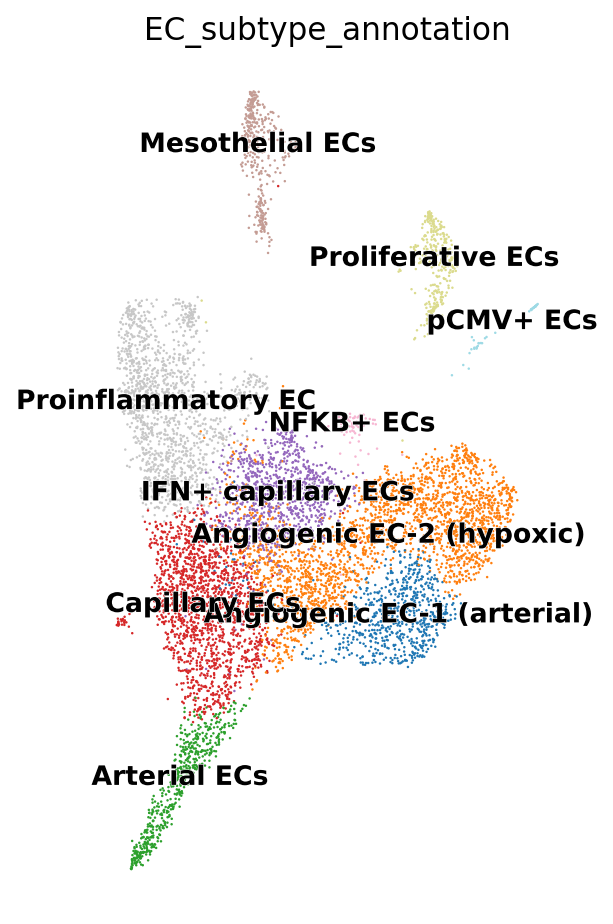

In [6]:
import matplotlib
import matplotlib.pyplot as plt
import scanpy as sc

fig, ax = plt.subplots(figsize=(4, 6))

sc.pl.umap(adata_vascular_EC, 
           color=["EC_subtype_annotation"],
           frameon=False,
           legend_loc='on data',
           legend_fontoutline=0.5,
           size=5,
           legend_fontsize=12,
           palette="tab20",  # Your custom color dictionary
           ax=ax,
           show=False)

ax.set_xlabel('UMAP1', fontsize=16, loc='left')
ax.set_ylabel('UMAP2', fontsize=16, loc='bottom')
ax.tick_params(labelbottom=True, labelleft=True, labelsize=14)
plt.tight_layout()
plt.show()


In [22]:
custom_palette = {
    'Mesothelial ECs': "#377eb8",   # blue
    'Proliferative ECs': "#ff7f00", # orange
    'pCMV+ ECs': "#e41a1c",         # brown
    'Proinflammatory EC': "#f781bf",# pink
    'NFKB+ ECs': "#984ea3",         # purple
    'IFN+ capillary ECs': "#999999",# grey
    'Angiogenic EC-2 (hypoxic)': '#bcbd22', # green
    'Capillary ECs': "#a65628",       # grey
    'Angiogenic EC-1 (arterial)': "#ffff33",# yellow
    'Arterial ECs': "#1b9e77"       # teal
}

In [10]:
#import matplotlib.pyplot as plt
#import scanpy as sc
#
## Create figure with high resolution
#fig, ax = plt.subplots(figsize=(4, 4), dpi=300)
#
## Generate UMAP plot
#sc.pl.umap(adata_vascular_EC, 
#           color=["EC_subtype_annotation"],
#           frameon=False,
#           legend_loc='off data',
#           legend_fontoutline=0.5,
#           size=4,
#           legend_fontsize=12,
#           palette=custom_palette,
#           ax=ax,
#           show=False)
#
## Axis labels and tick parameters
#ax.set_xlabel('UMAP1', fontsize=16, loc='left')
#ax.set_ylabel('UMAP2', fontsize=16, loc='bottom')
#ax.tick_params(labelbottom=True, labelleft=True, labelsize=14)
#plt.tight_layout()
#
## Save to PDF with high quality
#pdf_folder = '/data2/core-med1/fibecker/fibecker/New_data_Xentransplantation/FINAL_whole_object_all_combined/Whole_object analysis/UMAPS_for_publication/UMAPS_Results_PDF/'
#pdf_name = 'UMAP_Vascular_EC_without_legend_new_colors.pdf'
#output_path = pdf_folder + pdf_name
#plt.savefig(output_path, format='pdf', dpi=300, bbox_inches='tight', pad_inches=0.1)
#
## Display plot
#plt.show()


# Fibroblasts

In [3]:
adata_fibroblasts=sc.read_h5ad('/data2/core-med1/elindber/PROJECTS/20231020_el_Xenotransplant/results/20240220_el_Xenotransplant_BR_FB_PIG_2ndIT_ANNOTATED.h5ad')

In [4]:
adata_fibroblasts

AnnData object with n_obs × n_vars = 16322 × 3571
    obs: 'n_genes', 'scrublet_score_default', 'predicted_doublets_default', 'scrublet_score_z', 'predicted_doublets_z', 'scrublet_score_log', 'predicted_doublets_log', 'percent_mito', 'percent_ribo', 'percent_ribo_RPS', 'percent_ribo_RPL', 'n_counts', 'solo_softmax_scores', 'solo_logit_scores', 'solo_is_doublet', 'n_counts_Papio_anubis', 'n_counts_Sus_scrofa', 'n_genes_Papio_anubis', 'n_genes_Sus_scrofa', 'Sample_ID', 'doublets_ncounts', 'pCMV_score', 'n_counts_pCMV', 'leiden_02', 'cell_type', 'cell_type_V1', 'Treatment', 'Survival', 'Endpoint_status', 'leiden_08', 'cell_states', 'leiden_07'
    var: 'Average_expression', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Endpoint_status_colors', 'Sample_ID_colors', 'cell_states_colors', 'hvg', 'leiden', 'leiden_07_colors', 'leiden_08_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp

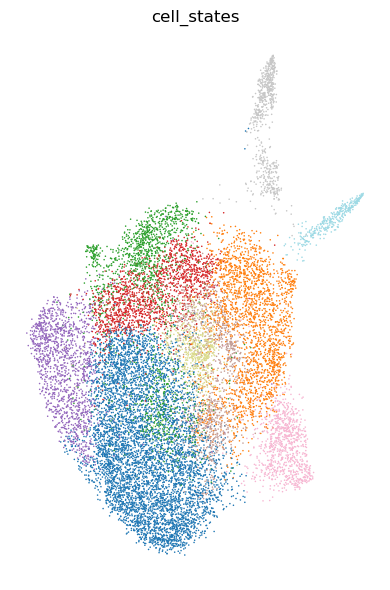

In [5]:
import matplotlib
import matplotlib.pyplot as plt
import scanpy as sc

fig, ax = plt.subplots(figsize=(4, 6))

sc.pl.umap(adata_fibroblasts, 
           color=["cell_states"],
           frameon=False,
           legend_loc='off data',
           legend_fontoutline=0.5,
           size=5,
           legend_fontsize=12,
           palette="tab20",  # Your custom color dictionary
           ax=ax,
           show=False)

ax.set_xlabel('UMAP1', fontsize=16, loc='left')
ax.set_ylabel('UMAP2', fontsize=16, loc='bottom')
ax.tick_params(labelbottom=True, labelleft=True, labelsize=14)
plt.tight_layout()
plt.show()


In [7]:
custom_palette = {
    'vFB1': "#377eb8",   # blue
    'vFB2': "#ff7f00", # orange
    'vFB3': "#9edae5",         # brown
    'vFB4': "#f781bf",# pink
    'vFB5': "#984ea3",         # purple
    'vFB6': "#999999",# grey
    'vFB7': '#bcbd22', # green
    'vFB8': "#a65628",       # grey
    'vFB9': "#ffff33",# yellow
    'vFB10': "#1b9e77"       # teal
}

In [9]:
#import matplotlib.pyplot as plt
#import scanpy as sc
#
## Create figure with high resolution
#fig, ax = plt.subplots(figsize=(4, 4), dpi=300)
#
## Generate UMAP plot
#sc.pl.umap(adata_fibroblasts, 
#           color=["cell_states"],
#           frameon=False,
#           legend_loc='off data',
#           legend_fontoutline=0.5,
#           size=4,
#           legend_fontsize=12,
#           palette=custom_palette,
#           ax=ax,
#           show=False)
#
## Axis labels and tick parameters
#ax.set_xlabel('UMAP1', fontsize=16, loc='left')
#ax.set_ylabel('UMAP2', fontsize=16, loc='bottom')
#ax.tick_params(labelbottom=True, labelleft=True, labelsize=14)
#plt.tight_layout()

# Save to PDF with high quality
#pdf_folder = '/data2/core-med1/fibecker/fibecker/New_data_Xentransplantation/FINAL_whole_object_all_combined/Whole_object analysis/UMAPS_for_publication/UMAPS_Results_PDF/'
#pdf_name = 'UMAP_FB_without_legend_New_Colors.pdf'
#output_path = pdf_folder + pdf_name
#plt.savefig(output_path, format='pdf', dpi=600, bbox_inches='tight', pad_inches=0.1)

# Display plot
#plt.show()


# Myeloids_papio

In [5]:
adata_myeloids_papio=sc.read_h5ad("/data2/core-med1/fibecker/fibecker/New_data_Xentransplantation/Final_annotated_objects/Final_baboon_myeloids.h5ad")


In [6]:
adata_myeloids_papio

AnnData object with n_obs × n_vars = 9999 × 2297
    obs: 'n_genes', 'scrublet_score_default', 'predicted_doublets_default', 'scrublet_score_z', 'predicted_doublets_z', 'scrublet_score_log', 'predicted_doublets_log', 'percent_mito', 'percent_ribo', 'percent_ribo_RPS', 'percent_ribo_RPL', 'n_counts', 'solo_softmax_scores', 'solo_logit_scores', 'solo_is_doublet', 'n_counts_Papio_anubis', 'n_counts_Sus_scrofa', 'n_genes_Papio_anubis', 'n_genes_Sus_scrofa', 'Sample_ID', 'doublets_ncounts', 'pCMV_score', 'n_counts_pCMV', 'leiden_02', 'cell_type', 'cell_type_V1', 'Treatment', 'Survival', 'Endpoint_status', 'leiden_01', 'leiden_08', 'leiden_07', 'new_endpoints', 'leiden_named_02', 'leiden_named_08', 'leiden_named_07'
    var: 'Average_expression', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Endpoint_status_colors', 'Sample_ID_colors', 'Treatment_colors', 'hvg', 'leiden_01', 'leiden_01_colors', 'leiden_02', 'leiden_02_colors', 'leiden_07', 'leiden_07_

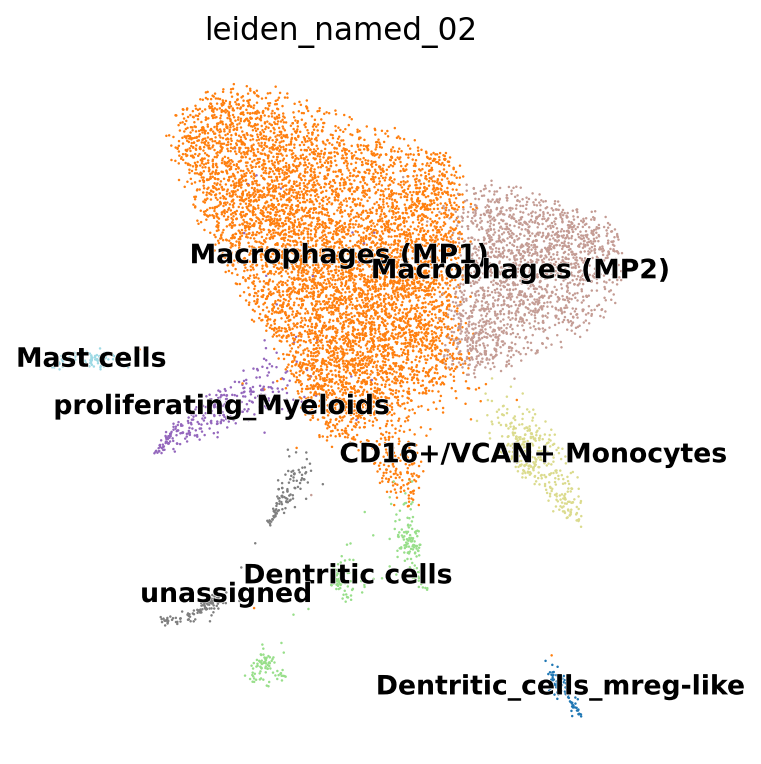

In [7]:
import matplotlib
import matplotlib.pyplot as plt
import scanpy as sc

fig, ax = plt.subplots(figsize=(5, 5))

sc.pl.umap(adata_myeloids_papio, 
           color=["leiden_named_02"],
           frameon=False,
           legend_loc='on data',
           legend_fontoutline=0.5,
           size=5,
           legend_fontsize=12,
           palette='tab20',  # Your custom color dictionary
           ax=ax,
           show=False)

ax.set_xlabel('UMAP1', fontsize=16, loc='left')
ax.set_ylabel('UMAP2', fontsize=16, loc='bottom')
ax.tick_params(labelbottom=True, labelleft=True, labelsize=14)
plt.tight_layout()
plt.show()


In [12]:
custom_palette = {
    'Mast cells': "#377eb8",   # blue
    'proliferating_Myeloids': "#ff7f00", # orange
    'CD16+/VCAN+ Monocytes': "#9edae5",         # brown
    'Macrophages (MP1)': "#f781bf",# pink
    'Macrophages (MP2)': "#984ea3",         # purple
    'Dentritic cells': "#999999",# grey
    'Dentritic_cells_mreg-like': '#bcbd22', # green
    #'vFB8': "#a65628",       # grey
    #'vFB9': "#ffff33",# yellow
    #'vFB10': "#1b9e77"       # teal
}

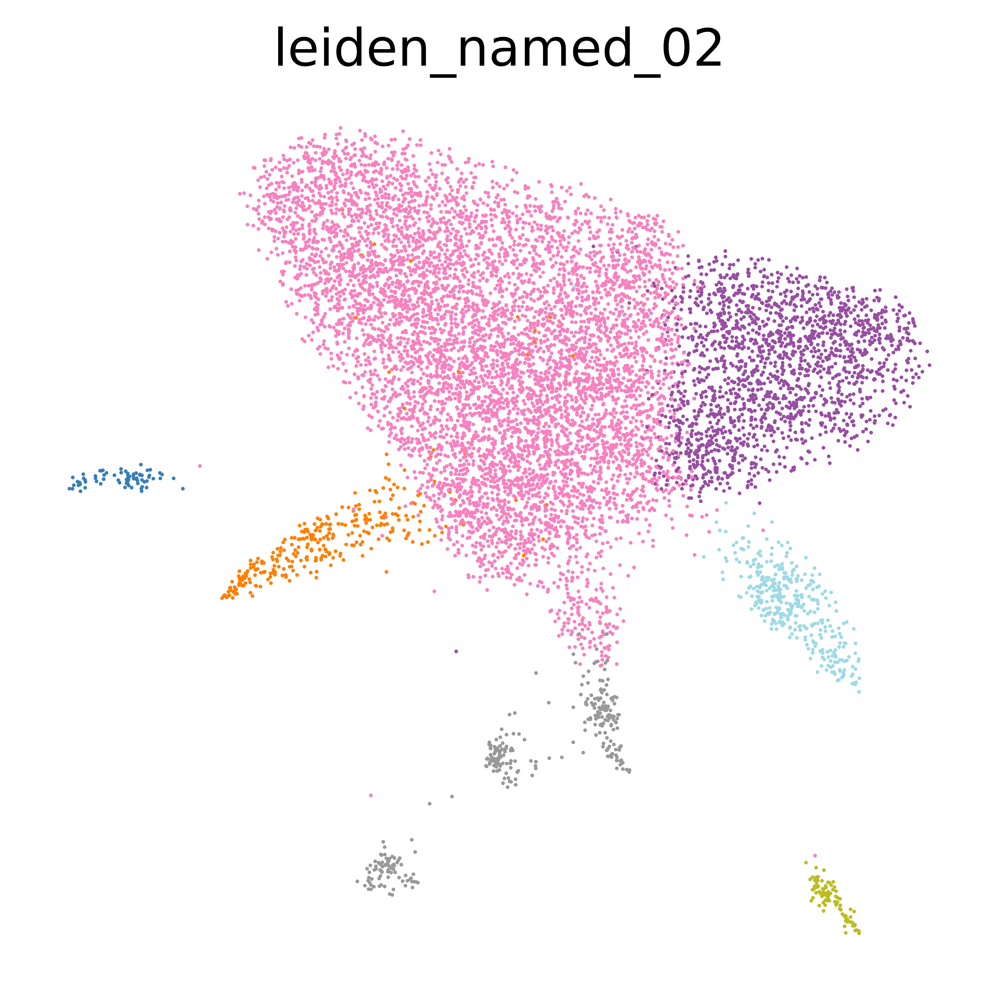

In [13]:
import matplotlib.pyplot as plt
import scanpy as sc

# Subset to exclude 'unassigned' cluster
myeloids_excl = adata_myeloids_papio[adata_myeloids_papio.obs['leiden_named_02'] != 'unassigned', :].copy()

# Create figure with high resolution
fig, ax = plt.subplots(figsize=(4, 4), dpi=600)

# Generate UMAP plot without 'unassigned'
sc.pl.umap(myeloids_excl, 
           color=["leiden_named_02"],
           frameon=False,
           legend_loc='off data',
           legend_fontoutline=0.5,
           size=4,
           legend_fontsize=12,
           palette=custom_palette,
           ax=ax,
           show=False)

# Axis labels and tick parameters
ax.set_xlabel('UMAP1', fontsize=16, loc='left')
ax.set_ylabel('UMAP2', fontsize=16, loc='bottom')
ax.tick_params(labelbottom=True, labelleft=True, labelsize=14)
plt.tight_layout()

# Save to PDF with high quality
pdf_folder = '/data2/core-med1/fibecker/fibecker/New_data_Xentransplantation/FINAL_whole_object_all_combined/Whole_object analysis/UMAPS_for_publication/UMAPS_Results_PDF/'
pdf_name = 'UMAP_Myeloids_without_legend_New_Colors.pdf'
output_path = pdf_folder + pdf_name
plt.savefig(output_path, format='pdf', dpi=600, bbox_inches='tight', pad_inches=0.1)

# Display plot
#plt.show()


# Macrophages_papio

In [14]:
adata_MPs_papio=sc.read_h5ad("/data2/core-med1/fibecker/fibecker/New_data_Xentransplantation/Immunecells_without_regress_out/FINAL_Objects_Annotated_Without_RO/NEWFINAL_Baboon_Macrophages_Annotated_Without_RO_250519.h5ad")

In [15]:
adata_MPs_papio

AnnData object with n_obs × n_vars = 9064 × 2286
    obs: 'n_genes', 'scrublet_score_default', 'predicted_doublets_default', 'scrublet_score_z', 'predicted_doublets_z', 'scrublet_score_log', 'predicted_doublets_log', 'percent_mito', 'percent_ribo', 'percent_ribo_RPS', 'percent_ribo_RPL', 'n_counts', 'solo_softmax_scores', 'solo_logit_scores', 'solo_is_doublet', 'n_counts_Papio_anubis', 'n_counts_Sus_scrofa', 'n_genes_Papio_anubis', 'n_genes_Sus_scrofa', 'Sample_ID', 'doublets_ncounts', 'pCMV_score', 'n_counts_pCMV', 'leiden_02', 'cell_type', 'cell_type_V1', 'Treatment', 'Survival', 'Endpoint_status', 'leiden_06', 'leiden_07', 'leiden_08', 'leiden_09', 'leiden_10', 'leiden_11', 'MP_named_07', 'MP_named_08', 'MP_named_10', 'new_endpoints'
    var: 'Average_expression', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'MP_named_07_colors', 'MP_named_08_colors', 'MP_named_10_colors', 'Sample_ID_colors', 'hvg', 'leiden_06', 'leiden_06_colors', 'leiden_07

In [16]:
import numpy as np
import matplotlib.colors as mcolors

# Get unique cell types
cell_type = np.unique(adata_MPs_papio.obs['MP_named_10'])

# Your custom color list (extend as needed)
color_list = [
 '#6A0DAD',  # Purple
    '#8A2BE2',  # Blue Violet
    '#1E90FF',  # Dodger Blue
    '#9370DB',  # Medium Purple
    '#BA55D3',  # Medium Orchid
    '#FF69B4',  # Hot Pink
    '#FF1493',  # Deep Pink
    '#DB7093',  # Pale Violet Red
    '#7B68EE',  # Medium Slate Blue
    '#00BFFF',  # Deep Sky Blue
    '#6495ED',  # Cornflower Blue
    
][:len(cell_type)]  # Trim to exact number needed

# Create dictionary {cell_type: hex_color}
color_dict = {ct: color_list[i] for i, ct in enumerate(cell_type)}


In [11]:
#import numpy as np
#import matplotlib.pyplot as plt
#import matplotlib.colors as mcolors
#
## Get unique cell types
#cell_type = np.unique(adata_MPs_papio.obs['MP_named_10'])
#
## Generate a list of highly distinguishable colors
#num_colors = len(cell_type)
#colors = plt.cm.tab20(np.linspace(0, 1, num_colors))
#hex_colors = [mcolors.to_hex(c) for c in colors]
#
## Create dictionary {cell_type: hex_color}
#color_dict = {ct: hex_colors[i] for i, ct in enumerate(cell_type)}
#

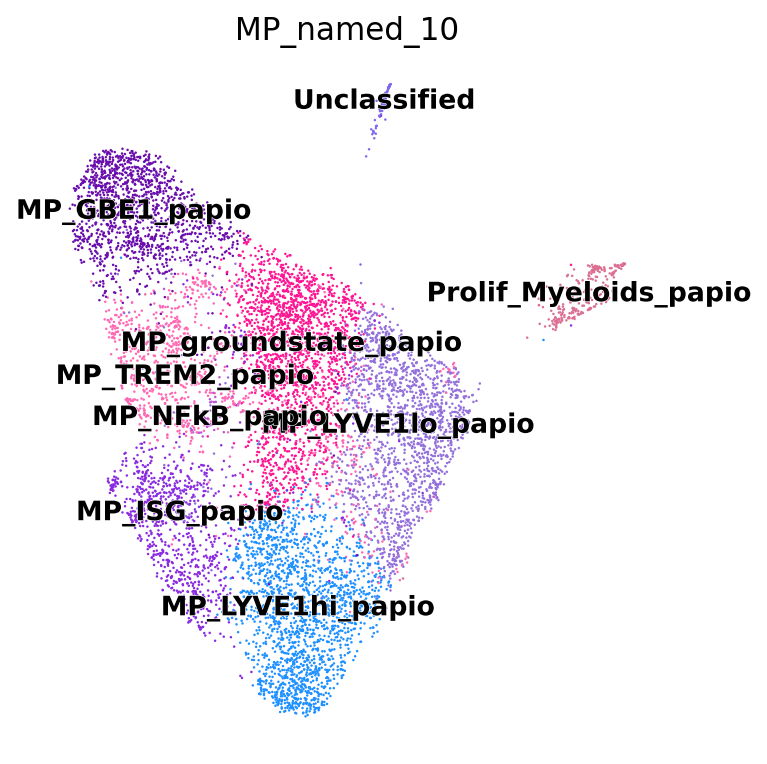

In [17]:
import matplotlib
import matplotlib.pyplot as plt
import scanpy as sc

fig, ax = plt.subplots(figsize=(5, 5))

sc.pl.umap(adata_MPs_papio, 
           color=["MP_named_10"],
           frameon=False,
           legend_loc='on data',
           legend_fontoutline=0.5,
           size=5,
           legend_fontsize=12,
           palette=color_dict,  # Your custom color dictionary
           ax=ax,
           show=False)

ax.set_xlabel('UMAP1', fontsize=16, loc='left')
ax.set_ylabel('UMAP2', fontsize=16, loc='bottom')
ax.tick_params(labelbottom=True, labelleft=True, labelsize=14)
plt.tight_layout()
plt.show()


In [18]:
import pandas as pd

color_table = pd.DataFrame(list(color_dict.items()), columns=['Cell State', 'Color'])
print(color_table)


              Cell State    Color
0          MP_GBE1_papio  #6A0DAD
1           MP_ISG_papio  #8A2BE2
2       MP_LYVE1hi_papio  #1E90FF
3       MP_LYVE1lo_papio  #9370DB
4          MP_NFkB_papio  #BA55D3
5         MP_TREM2_papio  #FF69B4
6   MP_groundstate_papio  #FF1493
7  Prolif_Myeloids_papio  #DB7093
8           Unclassified  #7B68EE


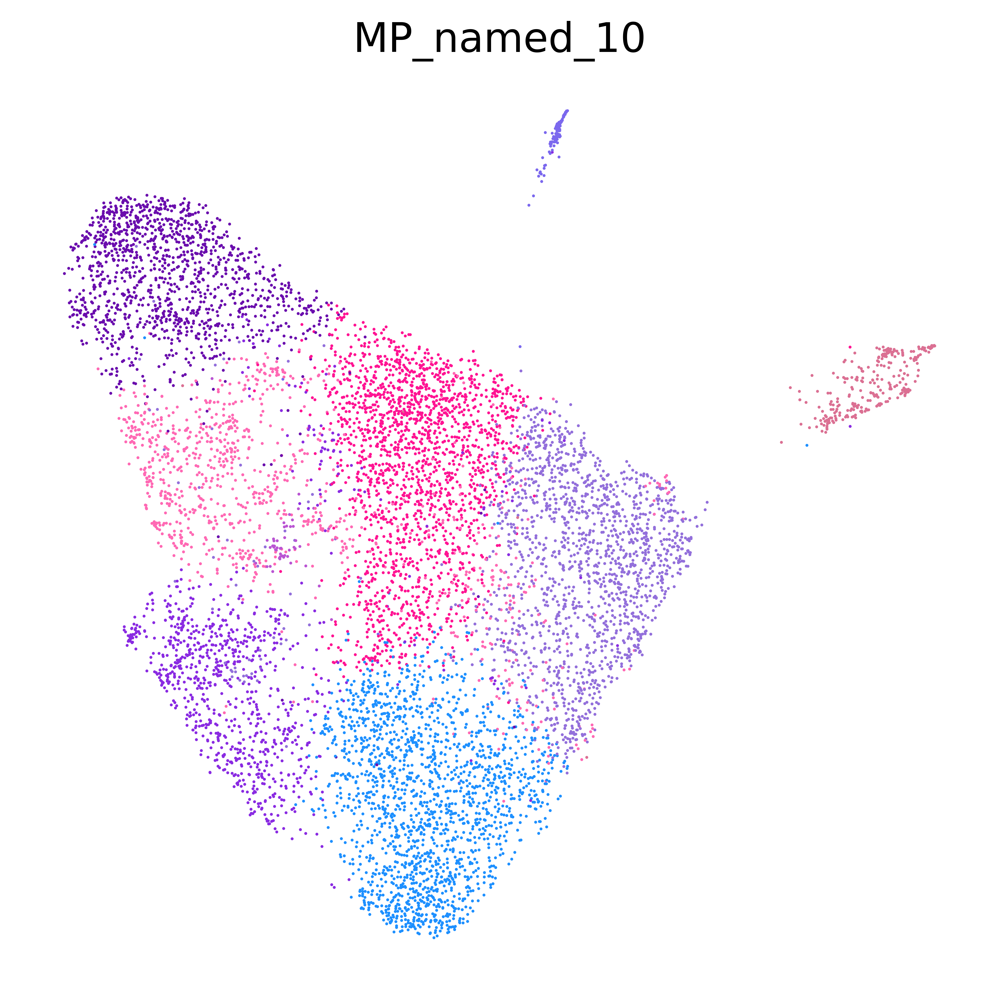

In [19]:
import matplotlib.pyplot as plt
import scanpy as sc

# Create figure with high resolution
fig, ax = plt.subplots(figsize=(5, 5), dpi=600)

# Generate UMAP plot
sc.pl.umap(adata_MPs_papio, 
           color=["MP_named_10"],
           frameon=False,
           legend_loc='off data',
           legend_fontoutline=0.5,
           size=4,
           legend_fontsize=12,
           palette=color_dict,
           ax=ax,
           show=False)

# Axis labels and tick parameters
ax.set_xlabel('UMAP1', fontsize=16, loc='left')
ax.set_ylabel('UMAP2', fontsize=16, loc='bottom')
ax.tick_params(labelbottom=True, labelleft=True, labelsize=14)
plt.tight_layout()

# Save to PDF with high quality
pdf_folder = '/data2/core-med1/fibecker/fibecker/New_data_Xentransplantation/FINAL_whole_object_all_combined/Whole_object analysis/UMAPS_for_publication/UMAPS_Results_PDF/'
pdf_name = 'Global_object_UMAP_Macrophages_papio_without_legend_New_colors.pdf'
output_path = pdf_folder + pdf_name
plt.savefig(output_path, format='pdf', dpi=600, bbox_inches='tight', pad_inches=0.1)

# Display plot
plt.show()


# Lymphoids_papio

In [23]:
adata_Lymphoids_papio=sc.read_h5ad('/data2/core-med1/fibecker/fibecker/New_data_Xentransplantation/Immunecells_without_regress_out/FINAL_Objects_Annotated_Without_RO/FINAL_Baboon_Lymphoids_Annotated_Without_RO.h5ad')

In [24]:
adata_Lymphoids_papio

AnnData object with n_obs × n_vars = 3774 × 3241
    obs: 'n_genes', 'scrublet_score_default', 'predicted_doublets_default', 'scrublet_score_z', 'predicted_doublets_z', 'scrublet_score_log', 'predicted_doublets_log', 'percent_mito', 'percent_ribo', 'percent_ribo_RPS', 'percent_ribo_RPL', 'n_counts', 'solo_softmax_scores', 'solo_logit_scores', 'solo_is_doublet', 'n_counts_Papio_anubis', 'n_counts_Sus_scrofa', 'n_genes_Papio_anubis', 'n_genes_Sus_scrofa', 'Sample_ID', 'doublets_ncounts', 'pCMV_score', 'n_counts_pCMV', 'leiden_02', 'cell_type', 'cell_type_V1', 'Treatment', 'Survival', 'Endpoint_status', 'new_endpoints', 'leiden_06', 'leiden_12', 'leiden_10', 'leiden_07', 'leiden_01', 'leiden_named_07', 'leiden_named_10', 'leiden_named_12', 'leiden', 'leiden_08', 'leiden_named_08'
    var: 'Average_expression', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Sample_ID_colors', 'hvg', 'leiden', 'leiden_01', 'leiden_01_colors', 'leiden_02', 'leiden_02_c

In [11]:
import numpy as np
import matplotlib.colors as mcolors

# Get unique cell types
cell_type = np.unique(adata_Lymphoids_papio.obs['leiden_named_08'])

# Your custom color list (extend as needed)
color_list = [
 '#cc7f4e',  '#e69e4e', '#e6aa45', '#e6b63c','#e69257', '#e6c233', '#d6c233', '#c6c233', '#b6c233', '#b16c46', '#a6c233'
    
][:len(cell_type)]  # Trim to exact number needed

# Create dictionary {cell_type: hex_color}
color_dict = {ct: color_list[i] for i, ct in enumerate(cell_type)}


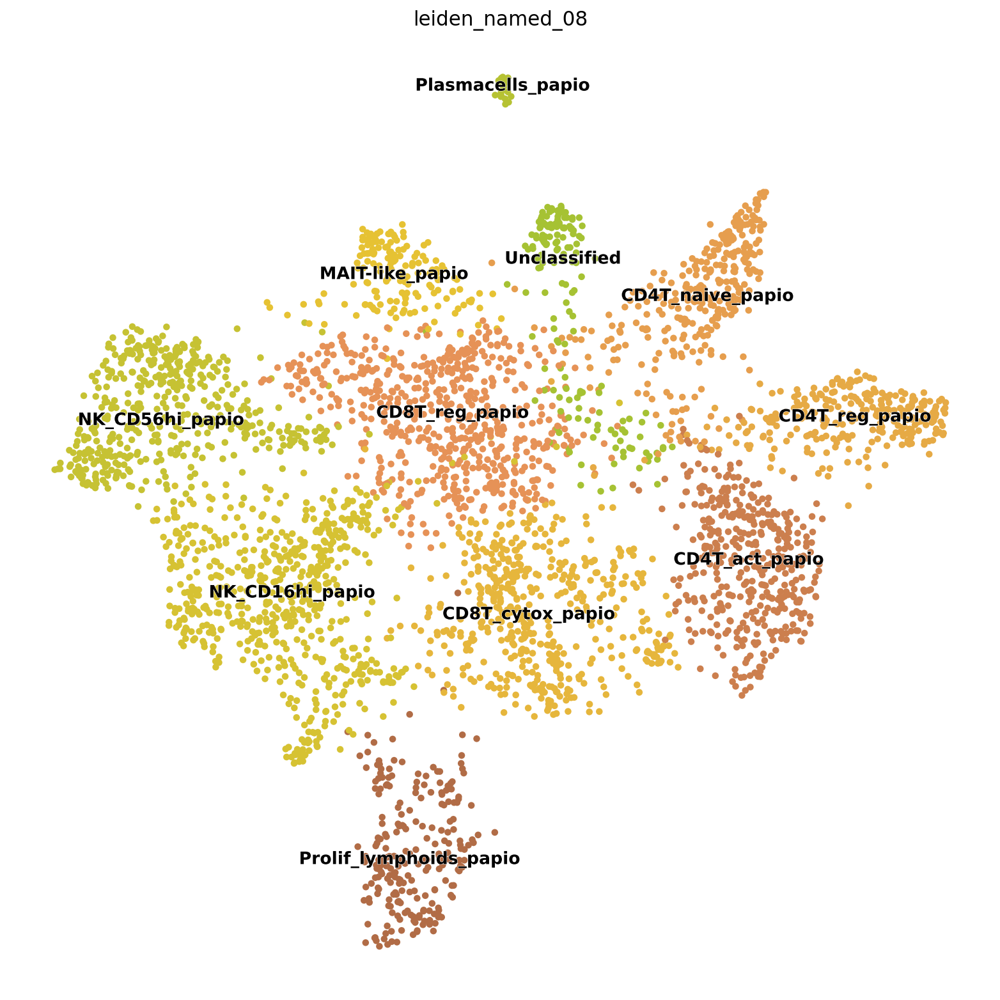

In [12]:
import matplotlib
import matplotlib.pyplot as plt
import scanpy as sc

fig, ax = plt.subplots(figsize=(10, 10))

sc.pl.umap(adata_Lymphoids_papio, 
           color=["leiden_named_08"],
           frameon=False,
           legend_loc='on data',
           legend_fontoutline=0.5,
           size=90,
           legend_fontsize=12,
           palette=color_dict,  # Your custom color dictionary
           ax=ax,
           show=False)

ax.set_xlabel('UMAP1', fontsize=16, loc='left')
ax.set_ylabel('UMAP2', fontsize=16, loc='bottom')
ax.tick_params(labelbottom=True, labelleft=True, labelsize=14)
plt.tight_layout()
plt.show()


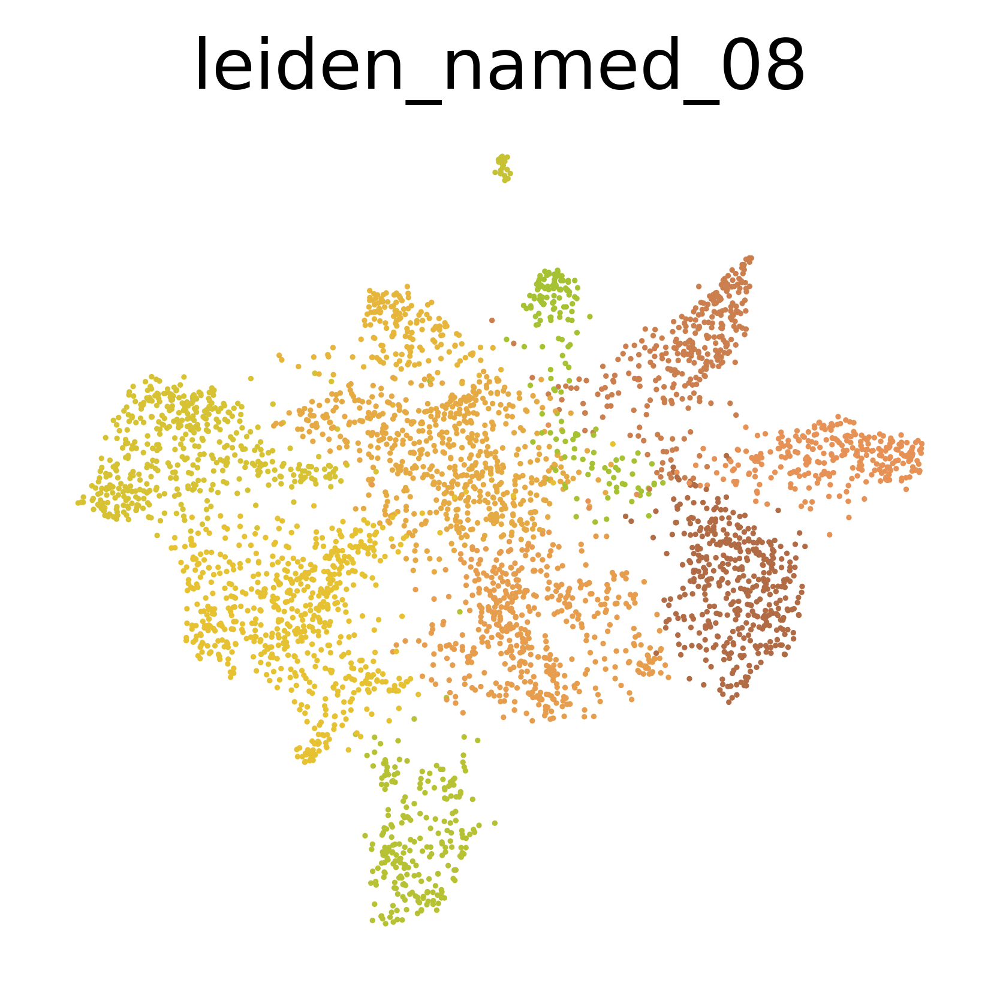

In [68]:
import matplotlib.pyplot as plt
import scanpy as sc

# Create figure with high resolution
fig, ax = plt.subplots(figsize=(3, 3), dpi=300)

# Generate UMAP plot
sc.pl.umap(adata_Lymphoids_papio, 
           color=["leiden_named_08"],
           frameon=False,
           legend_loc='off data',
           legend_fontoutline=0.5,
           size=5,
           legend_fontsize=12,
           palette=color_dict,
           ax=ax,
           show=False)

# Axis labels and tick parameters
ax.set_xlabel('UMAP1', fontsize=16, loc='left')
ax.set_ylabel('UMAP2', fontsize=16, loc='bottom')
ax.tick_params(labelbottom=True, labelleft=True, labelsize=14)
plt.tight_layout()

# Save to PDF with high quality
pdf_folder = '/data2/core-med1/fibecker/fibecker/New_data_Xentransplantation/FINAL_whole_object_all_combined/Whole_object analysis/UMAPS_for_publication/UMAPS_Results_PDF/'
pdf_name = 'Global_object_UMAP_Lymphoids_papio_without_legend.pdf'
output_path = pdf_folder + pdf_name
plt.savefig(output_path, format='pdf', dpi=300, bbox_inches='tight', pad_inches=0.1)

# Display plot
plt.show()


In [32]:
custom_palette = {
    'Plasmacells_papio': '#cc7f4e',   
    'Unclassified': "#ff7f00", 
    'MAIT-like_papio': "#e74c3c",        # → warm red
    'CD4T_naive_papio': '#e6aa45',
    'CD4T_reg_papio':  "#c0392b",       
    'CD4T_act_papio': '#e69257',
    'CD8T_cytox_papio': '#e6c233', 
    'Prolif_lymphoids_papio': "#a65628",       
    'CD8T_reg_papio': "#ffff33",
    'NK_CD56hi_papio': '#e6b63c',       # → deep brick red
    'NK_CD16hi_papio': "#d35400"         # → vivid reddish-orange
}

In [34]:
custom_palette = {
    'Plasmacells_papio': '#cc7f4e',      # medium brown-orange
    'Unclassified': "#ff7f00",           # strong orange
    'MAIT-like_papio': "#e74c3c",        # warm red
    'CD4T_naive_papio': '#e6aa45',       # golden yellow-orange
    'CD4T_reg_papio':  "#c0392b",        # deep brick red
    'CD4T_act_papio': '#e69257',         # salmon orange
    'CD8T_cytox_papio': '#ffd700',       # bright yellow, distinct from others
    'Prolif_lymphoids_papio': "#a65628", # rich brown
    'CD8T_reg_papio': "#ffec80",         # pale yellow, easily distinguished
    'NK_CD56hi_papio': "#e67e22",        # lively orange, more orange than salmon
    'NK_CD16hi_papio': "#d35400"         # reddish-orange, strong contrast
}

In [40]:
custom_palette = {
    'Plasmacells_papio': '#cc7f4e',      # brown-orange
    'Unclassified': '#ff7f00',           # vivid orange
    'MAIT-like_papio': '#e74c3c',        # strong red
    'CD4T_naive_papio': '#e6aa45',       # golden yellow
    'CD4T_reg_papio':    '#ffd700',      # deep red
    'CD4T_act_papio': '#e69257',         # salmon orange
    'CD8T_cytox_papio': '#c0392b',       # bright yellow (distinct from above)
    'Prolif_lymphoids_papio': '#a65628', # earthy brown
    'CD8T_reg_papio': '#ffec80',         # warm light yellow
    'NK_CD56hi_papio':  '#d35400', # apricot orange (less brown than salmon)
    'NK_CD16hi_papio':  '#ff9966',        # reddish-orange
}

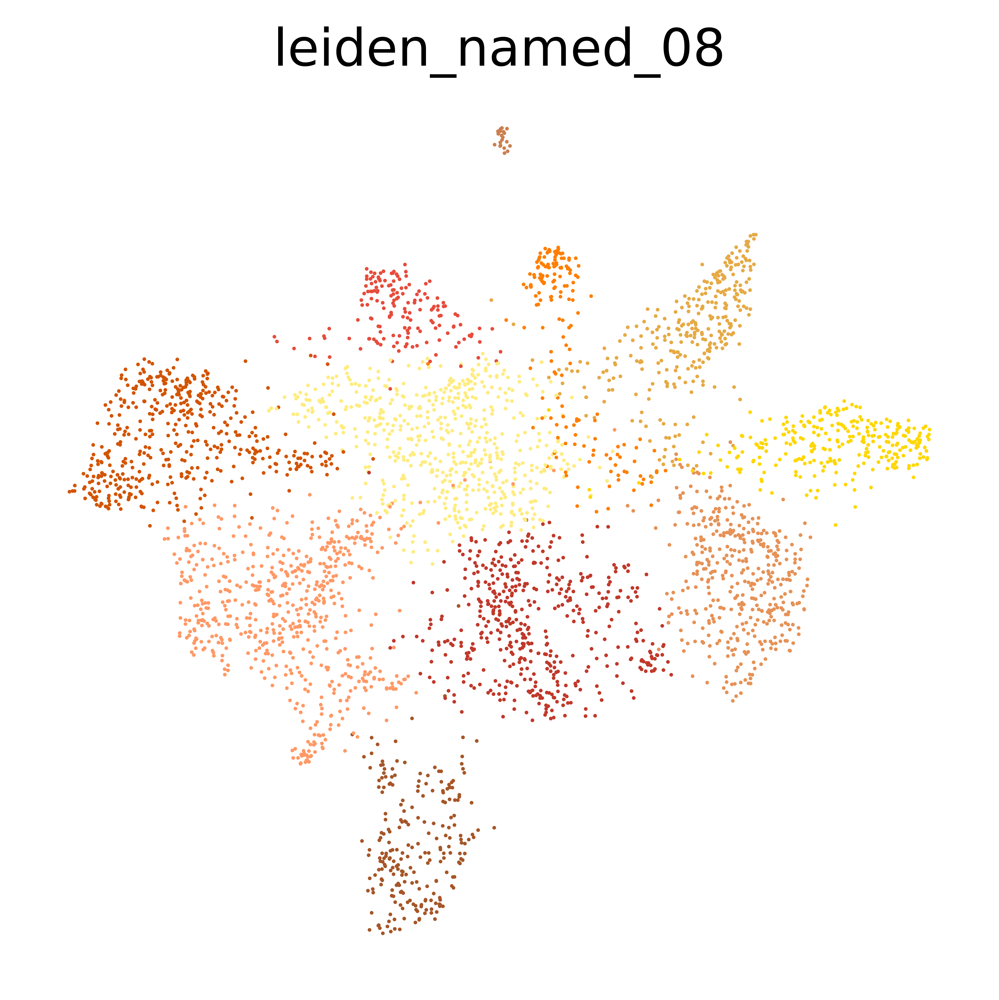

In [42]:
import matplotlib.pyplot as plt
import scanpy as sc

# Create figure with high resolution
fig, ax = plt.subplots(figsize=(4, 4), dpi=600)

# Generate UMAP plot
sc.pl.umap(adata_Lymphoids_papio, 
           color=["leiden_named_08"],
           frameon=False,
           legend_loc='off data',
           legend_fontoutline=0.5,
           size=4,
           legend_fontsize=12,
           palette=custom_palette,
           ax=ax,
           show=False)

# Axis labels and tick parameters
ax.set_xlabel('UMAP1', fontsize=16, loc='left')
ax.set_ylabel('UMAP2', fontsize=16, loc='bottom')
ax.tick_params(labelbottom=True, labelleft=True, labelsize=14)
plt.tight_layout()

# Save to PDF with high quality
pdf_folder = '/data2/core-med1/fibecker/fibecker/New_data_Xentransplantation/FINAL_whole_object_all_combined/Whole_object analysis/UMAPS_for_publication/UMAPS_Results_PDF/'
pdf_name = 'Global_object_UMAP_Lymph_papio_without_legend_New_colors.pdf'
output_path = pdf_folder + pdf_name
plt.savefig(output_path, format='pdf', dpi=600, bbox_inches='tight', pad_inches=0.1)

# Display plot
plt.show()
